### Event Distribution of Mice with Time

In [22]:
import sys
sys.path.insert(0, '../scripts')

import numpy as np
import direction_transition as dit
import paths
from meals import find_meals, graph_group_stats, find_meals_paper
from preprocessing import read_csv_clean
import intervals as invs

pellet_count_threshold = 5
collect_quantile = 0.7
pellet_quantile = 0.7
time_threshold = 60

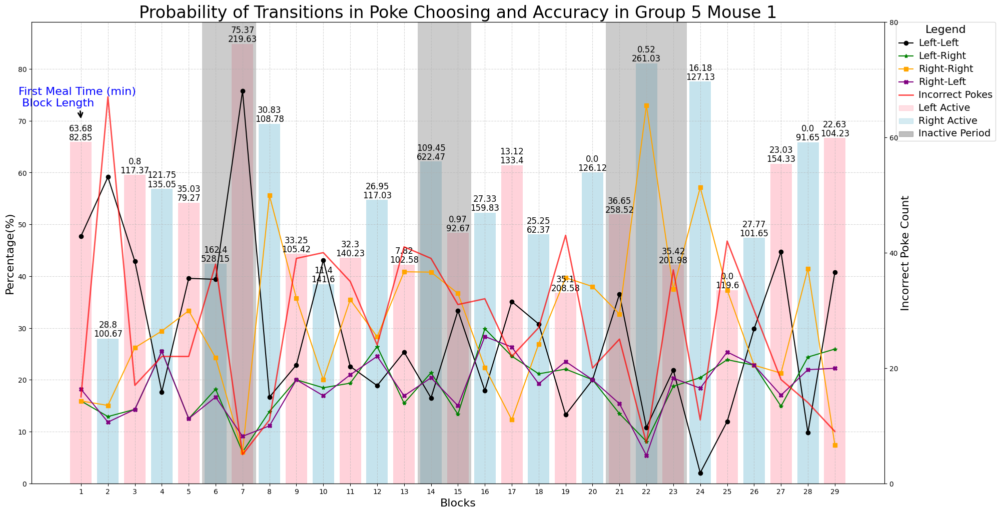

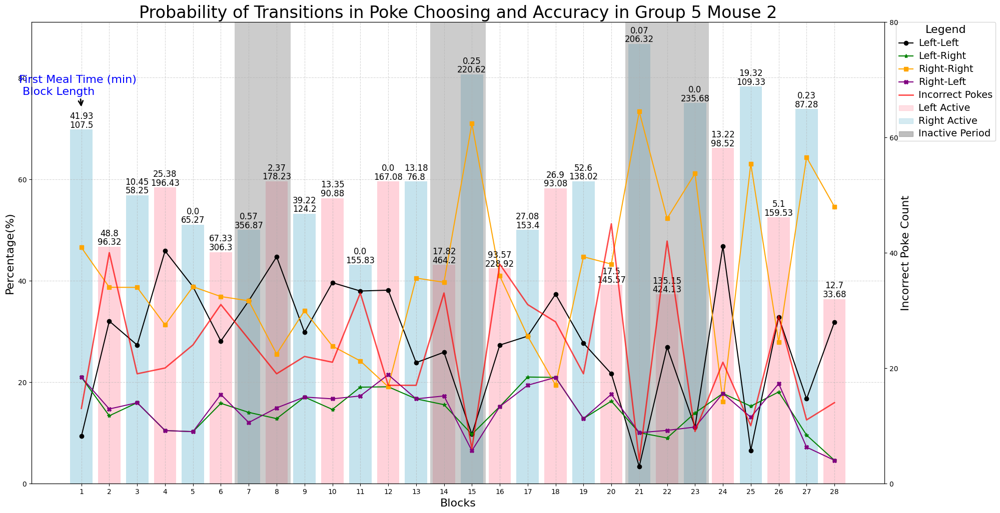

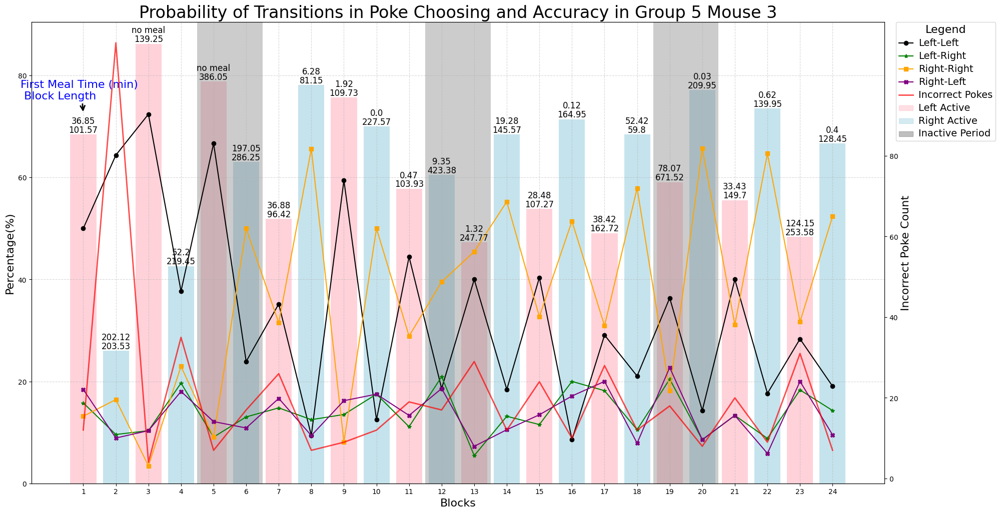

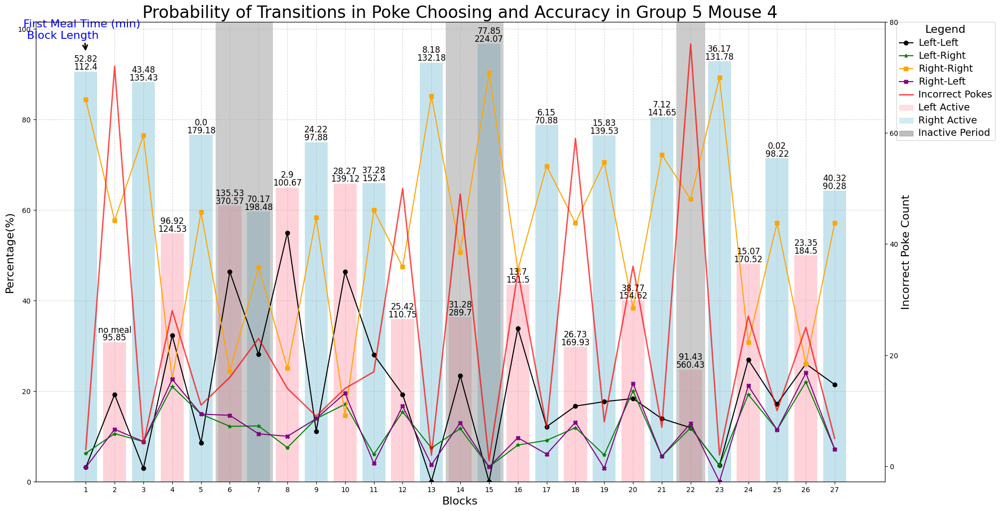

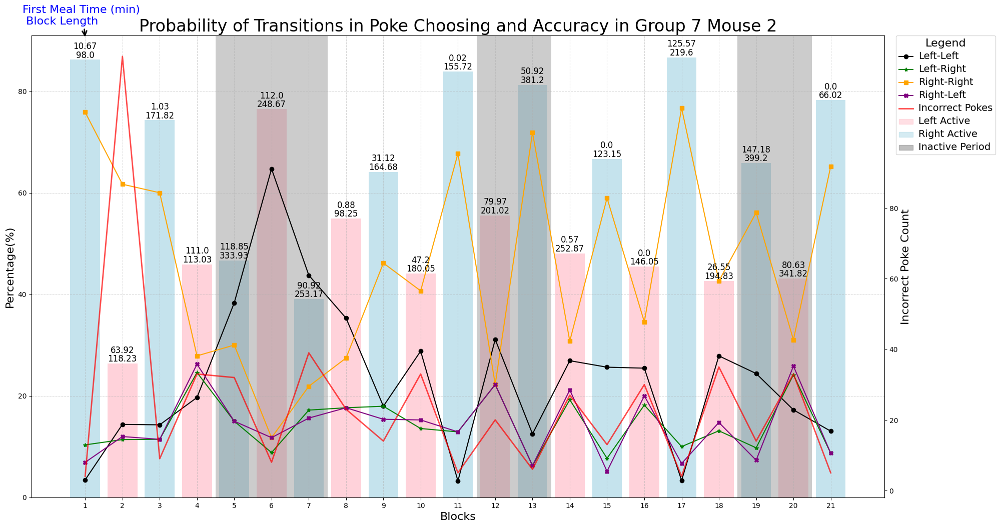

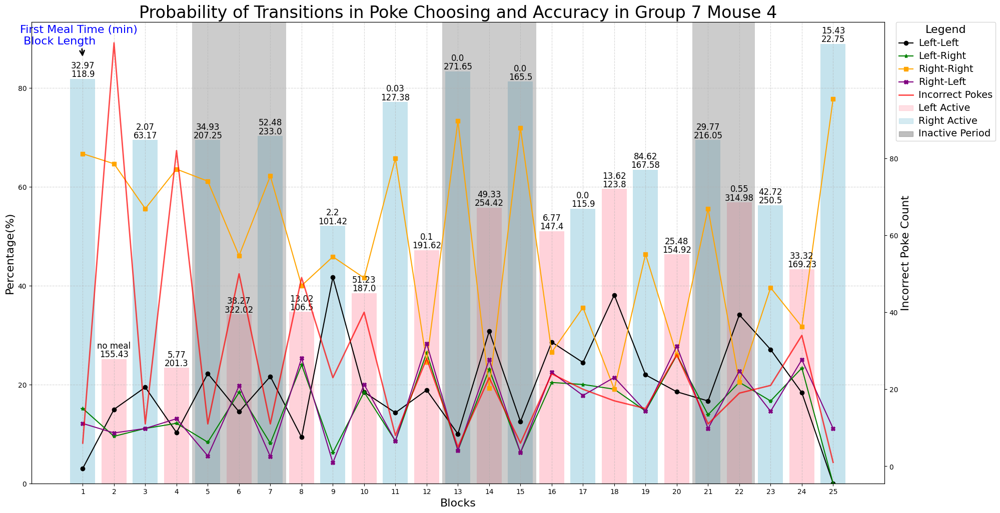

In [23]:
ctrl_block_fir_meal = []
ctrl_block_fir_meal_prop = []
for path in paths.contigency_flip_ctrl:
        data_dropped = read_csv_clean(path, remove_trivial=False, collect_time=True)
        blocks = dit.split_data_to_blocks(data_dropped)
        # meal = ml.find_meals(data, pellet_count_threshold=pellet_count_threshold, 
        #                      collect_quantile=collect_quantile, pellet_quantile=pellet_quantile)
        meal = find_meals_paper(data_dropped, time_threshold=time_threshold)
        data_stats = dit.get_transition_info(blocks, meal, reverse=False)
        
        avg_ratio, avg_time = dit.first_meal_stats(data_stats, ignore_inactive=True)
        ctrl_block_fir_meal.append(avg_time)
        ctrl_block_fir_meal_prop.append(avg_ratio)
        dit.graph_tranition_stats(data_stats, blocks, path)

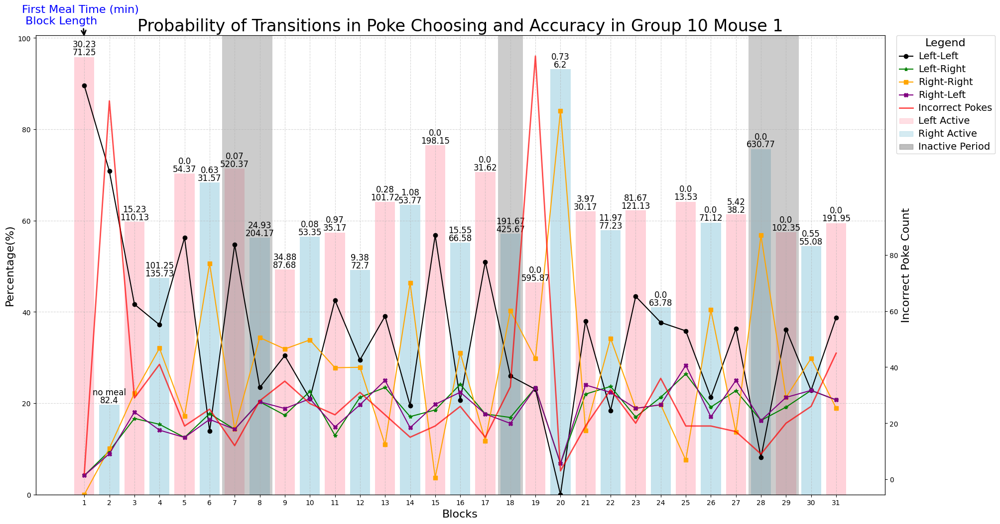

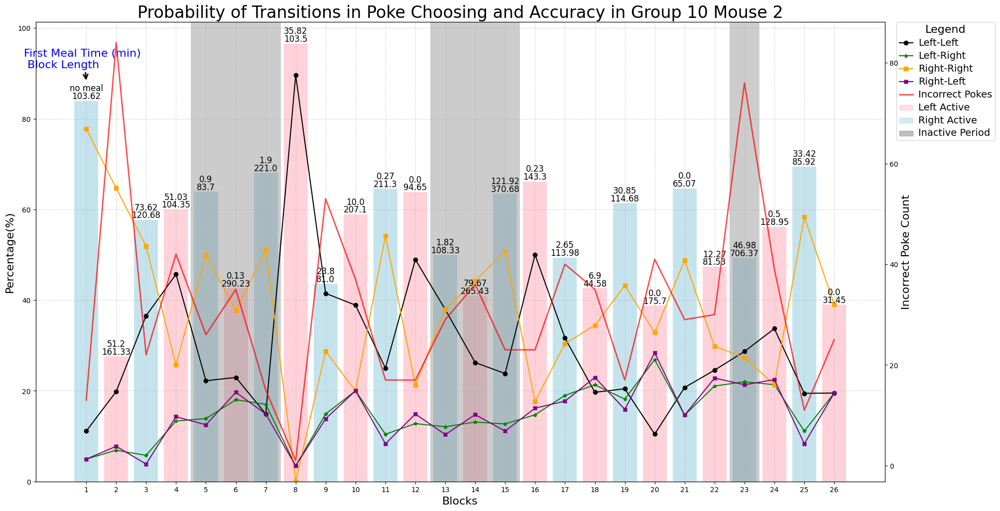

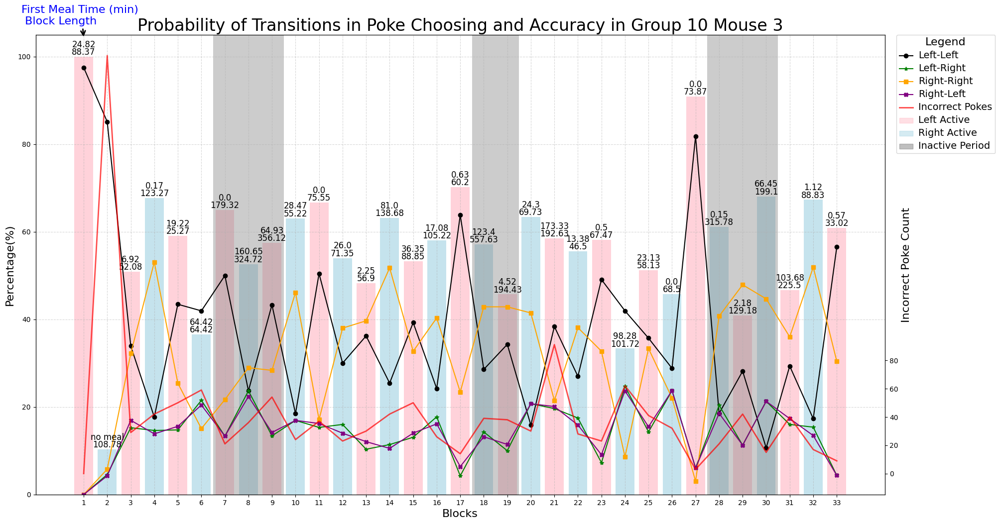

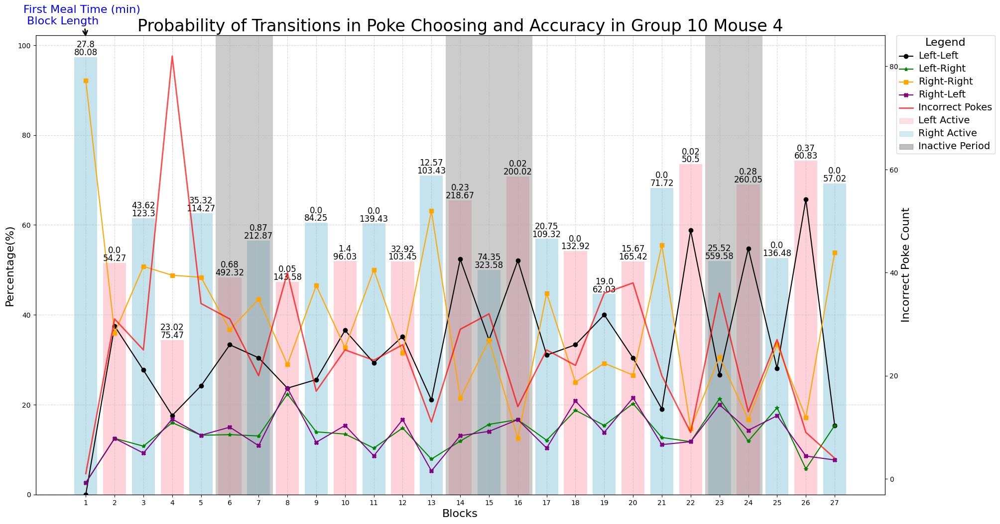

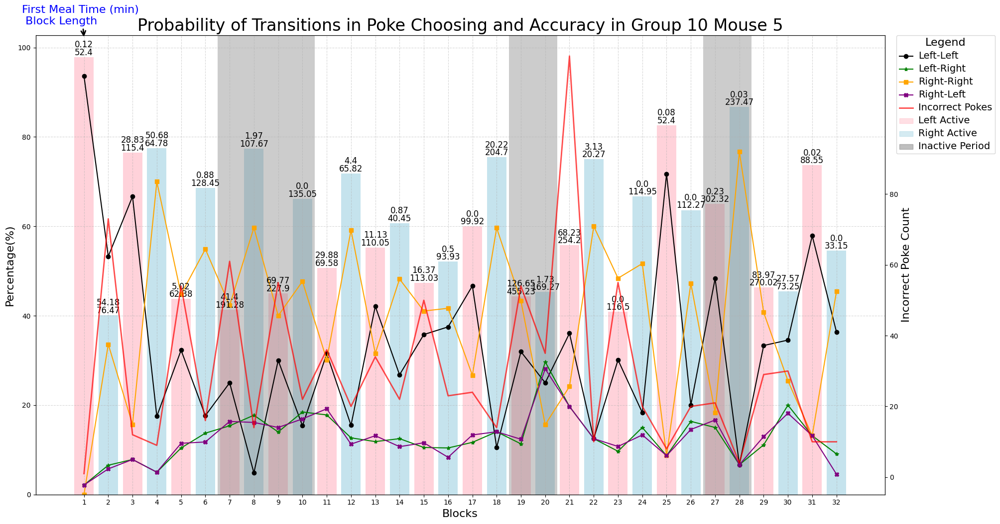

...

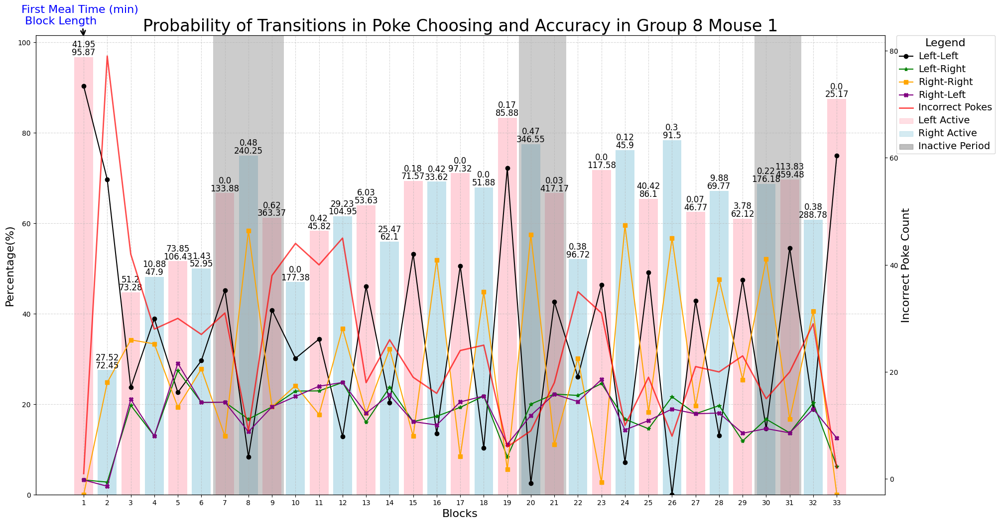

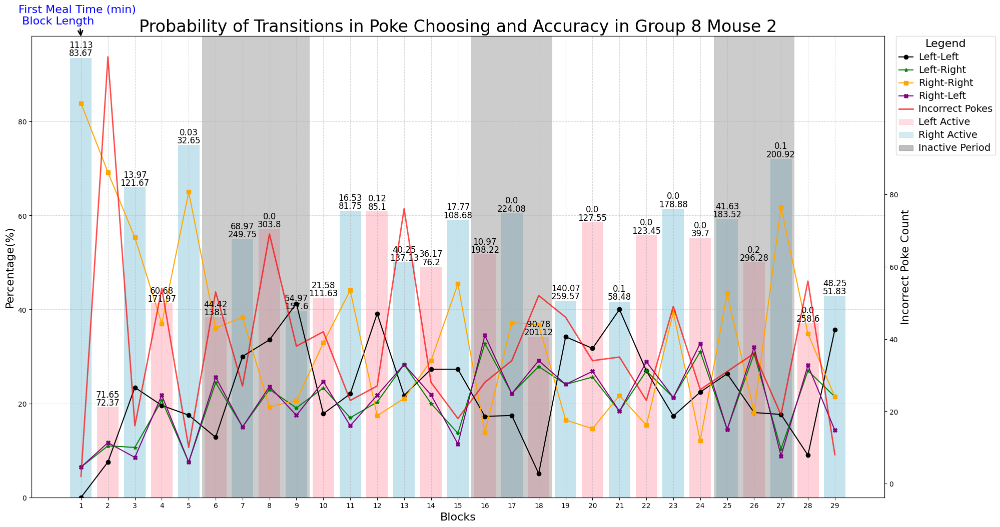

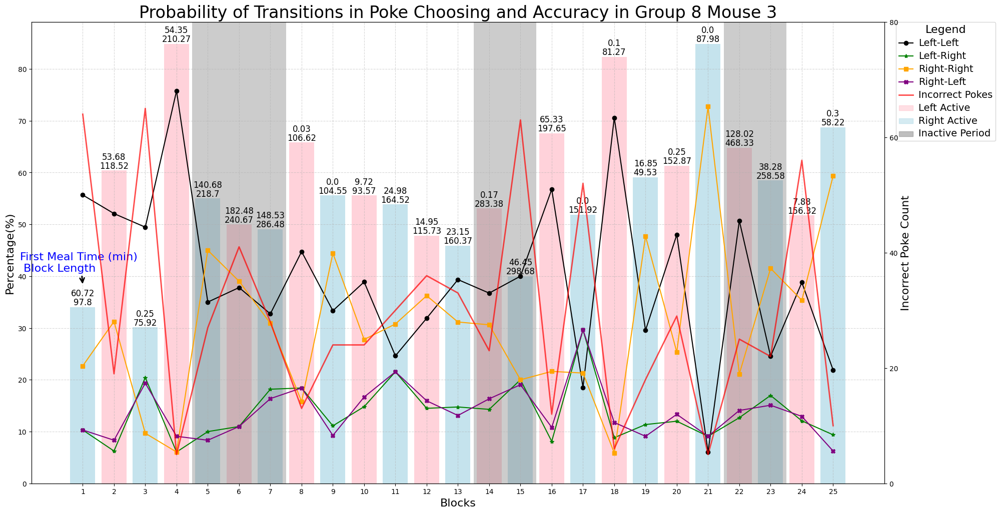

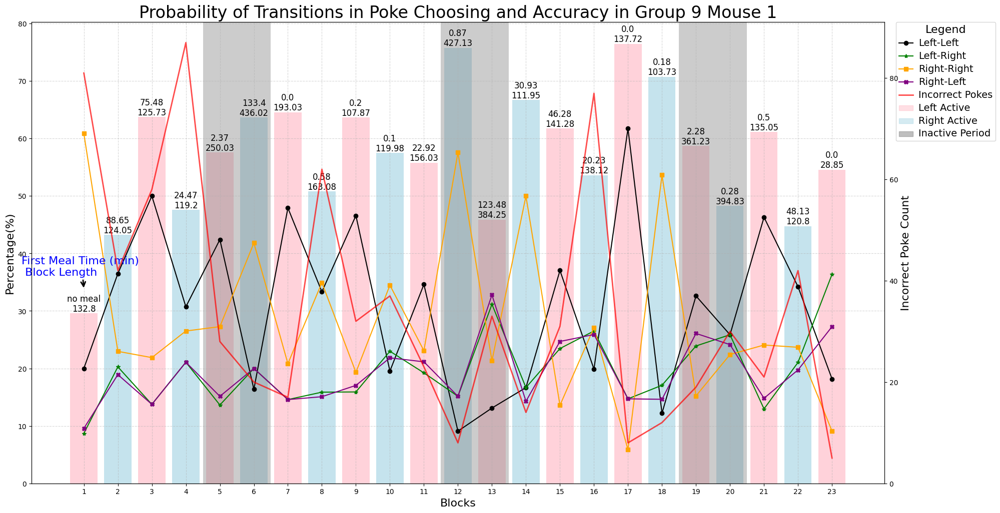

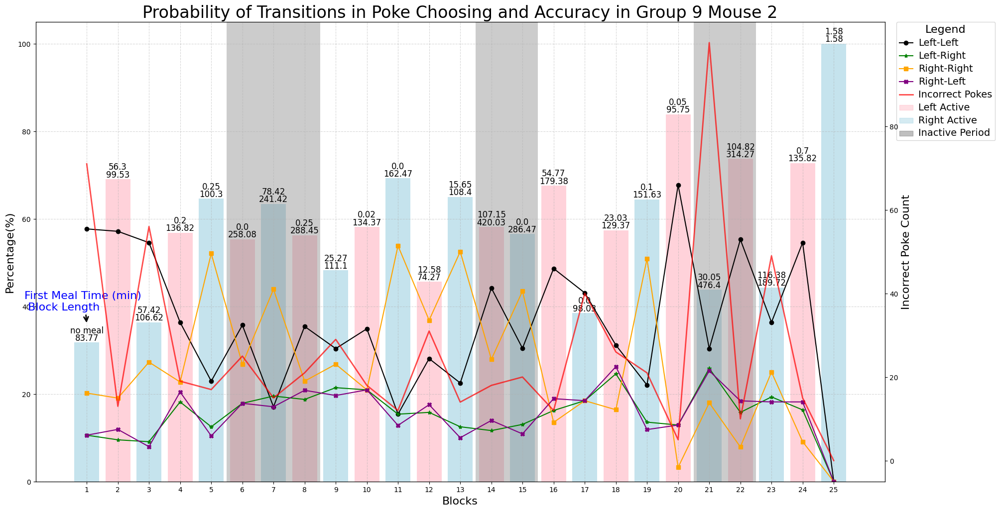

In [24]:
exp_block_fir_meal = []
exp_block_fir_meal_prop = []
for path in paths.contigency_flip_cask:
        data_dropped = read_csv_clean(path, remove_trivial=False, collect_time=True)
        blocks = dit.split_data_to_blocks(data_dropped)
        # meal = ml.find_meals(data, pellet_count_threshold=pellet_count_threshold, 
        #                      collect_quantile=collect_quantile, pellet_quantile=pellet_quantile)
        meal = find_meals_paper(data_dropped, time_threshold=time_threshold)
        data_stats = dit.get_transition_info(blocks, meal, reverse=False)
        
        avg_ratio, avg_time = dit.first_meal_stats(data_stats, ignore_inactive=True)
        exp_block_fir_meal.append(avg_time)
        exp_block_fir_meal_prop.append(avg_ratio)
        dit.graph_tranition_stats(data_stats, blocks, path)
# data_stats

In [25]:
invs.perform_T_test(ctrl_block_fir_meal, exp_block_fir_meal, test_side='less')

P Value is  0.002167369159100779
Experiment group is significantly less than control group


Control Size: 6
CASK Size: 14
Control Average: 27.580833333333334
CASK Average: 11.508928571428571
Control Standard Deviation: 9.306049869126356
CASK Standard Deviation: 10.388004394598504


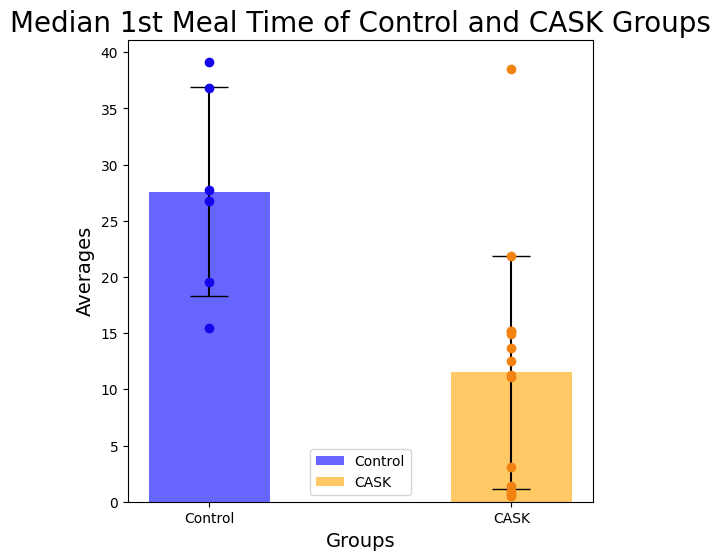

In [26]:
graph_group_stats(ctrl_block_fir_meal, exp_block_fir_meal, stats_name='Median 1st Meal Time', exp_name='CASK')

In [27]:
invs.perform_T_test(ctrl_block_fir_meal_prop, exp_block_fir_meal_prop, test_side='less')

P Value is  0.025343663861836094
Experiment group is significantly less than control group


Control Size: 6
CASK Size: 14
Control Average: 0.17710038205093206
CASK Average: 0.10329930600019878
Control Standard Deviation: 0.04556701433673566
CASK Standard Deviation: 0.08015794546872254


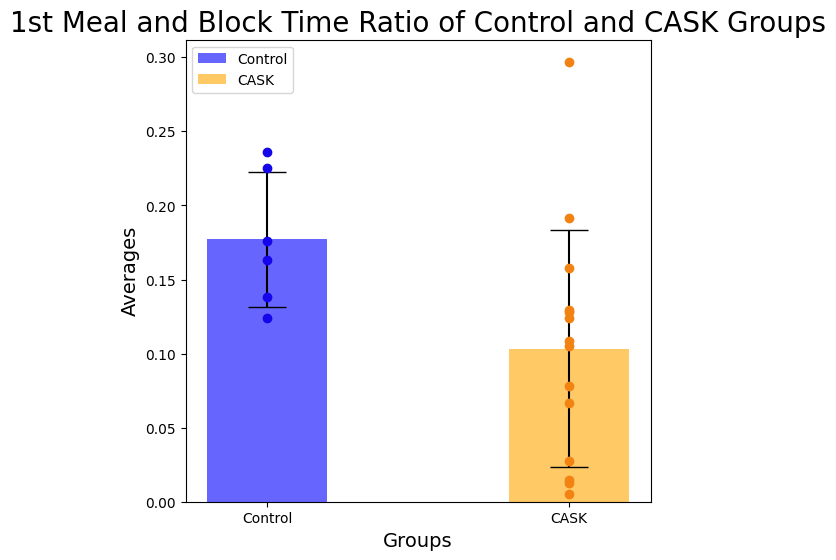

In [28]:
graph_group_stats(ctrl_block_fir_meal_prop, exp_block_fir_meal_prop, stats_name='1st Meal and Block Time Ratio', exp_name='CASK')

* In flipping poke case, we find that there is left or right stage (mice display a tendency to stick to one direction)
* there is only one stage at a time, and transition can take some times (1-2 stage to move to another)
* Generally, the accuracy is improved (>50~60% at the end and higher than the beginning)